# Notebook 6 : Déploiement et Prédictions

**Trash Hero - Tri Intelligent des Déchets par IA**

Dans ce notebook final, nous allons :
1. Créer une interface simple de prédiction
2. Tester sur de nouvelles images
3. Afficher les recommandations de tri
4. Préparer l'intégration mobile

## 6.1 Imports

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import mobilenet_v2
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
import json

# Import utils
import sys
sys.path.append('..')
from utils import WASTE_BINS, get_bin_recommendation, display_classification_result

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f" Device: {device}")

 Device: cpu


## 6.2 Chargement du Modèle Final

In [2]:
# Chemins
PROJECT_ROOT = Path('..')
MODELS_DIR = PROJECT_ROOT / 'models'
DATA_ROOT = PROJECT_ROOT / 'data'

# Charger les infos
with open(DATA_ROOT / 'data_info.json', 'r') as f:
    data_info = json.load(f)

n_classes = data_info['n_classes']
class_names = data_info['class_names']

# Créer le modèle
model = mobilenet_v2(weights=None)
model.classifier = nn.Sequential(
    nn.Dropout(0.2),
    nn.Linear(1280, n_classes)
)

# Charger les poids
model.load_state_dict(torch.load(MODELS_DIR / 'mobilenet_final_best.pth', map_location=device))
model.to(device)
model.eval()

print(" Modèle chargé et prêt!")
print(f" Classes: {class_names}")

 Modèle chargé et prêt!
 Classes: ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']


## 6.3 Transforms de Preprocessing

In [3]:
# Transforms pour la prédiction (identiques à l'entraînement)
predict_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                        std=[0.229, 0.224, 0.225])
])

print(" Transforms de prédiction configurés")

 Transforms de prédiction configurés


## 6.4 Fonction de Prédiction Complète

In [4]:
def predict_waste(image_path, model, transforms, class_names, device, show_image=True):
    """
    Prédit la classe d'un déchet et affiche les recommandations
    
    Args:
        image_path: Chemin vers l'image
        model: Modèle PyTorch
        transforms: Transformations à appliquer
        class_names: Liste des noms de classes
        device: Device (cuda/cpu)
        show_image: Afficher l'image ou non
    
    Returns:
        predicted_class: Classe prédite
        confidence: Confiance de la prédiction
        all_probs: Toutes les probabilités
    """
    # Charger et préprocesser l'image
    img = Image.open(image_path).convert('RGB')
    img_tensor = transforms(img).unsqueeze(0).to(device)
    
    # Prédiction
    model.eval()
    with torch.no_grad():
        outputs = model(img_tensor)
        probs = F.softmax(outputs, dim=1)[0]
        confidence, pred_idx = torch.max(probs, 0)
    
    predicted_class = class_names[pred_idx.item()]
    confidence = confidence.item()
    
    # Affichage
    if show_image:
        # Créer une figure avec 2 subplots
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
        
        # Image
        ax1.imshow(img)
        ax1.axis('off')
        ax1.set_title(f' Déchet Détecté', fontsize=16, fontweight='bold')
        
        # Barplot des probabilités
        all_probs = probs.cpu().numpy()
        colors = ['green' if i == pred_idx.item() else 'lightgray' for i in range(n_classes)]
        
        ax2.barh(class_names, all_probs, color=colors, edgecolor='black', linewidth=1.5)
        ax2.set_xlabel('Probabilité', fontsize=12, fontweight='bold')
        ax2.set_title(' Confiance du Modèle', fontsize=16, fontweight='bold')
        ax2.set_xlim(0, 1)
        ax2.grid(axis='x', alpha=0.3)
        
        # Ajouter les valeurs sur les barres
        for i, (cls, prob) in enumerate(zip(class_names, all_probs)):
            if prob > 0.05:  # Afficher seulement si > 5%
                ax2.text(prob + 0.02, i, f'{prob:.1%}', 
                        va='center', fontweight='bold', fontsize=10)
        
        plt.tight_layout()
        plt.show()
    
    # Afficher la recommandation de tri
    display_classification_result(predicted_class, confidence)
    
    return predicted_class, confidence, probs.cpu().numpy()

print(" Fonction de prédiction créée")

 Fonction de prédiction créée


## 6.5 Test sur Images du Test Set



 TEST SUR UN CARDBOARD


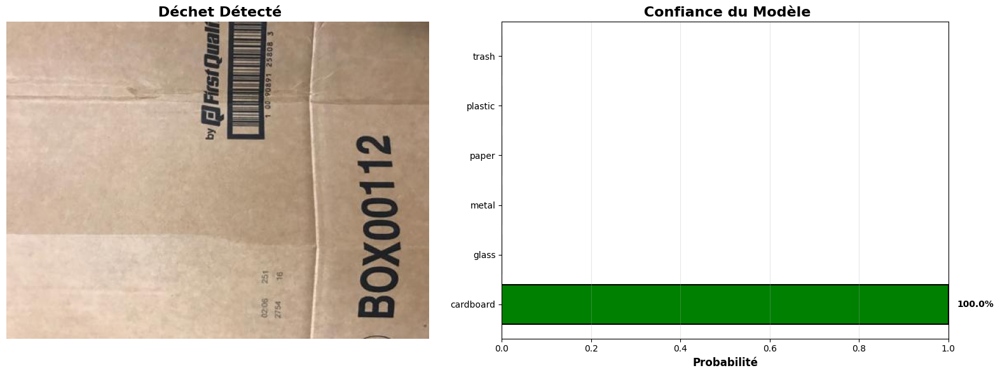


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: CARDBOARD
📊 Confiance: 100.0%

📦 Recyclable (Papier/Carton)
💡 Carton propre et sec



 PRÉDICTION CORRECTE!


 TEST SUR UN GLASS


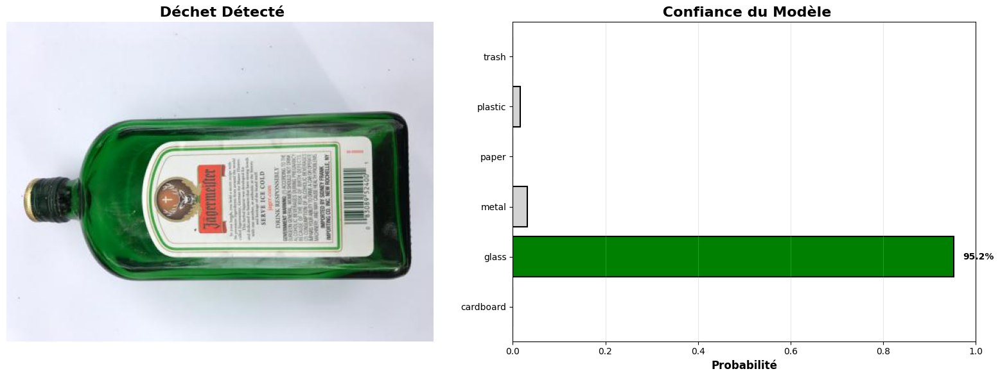


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: GLASS
📊 Confiance: 95.2%

🍾 Recyclable (Verre)
💡 Bouteilles et bocaux en verre



 PRÉDICTION CORRECTE!


 TEST SUR UN METAL


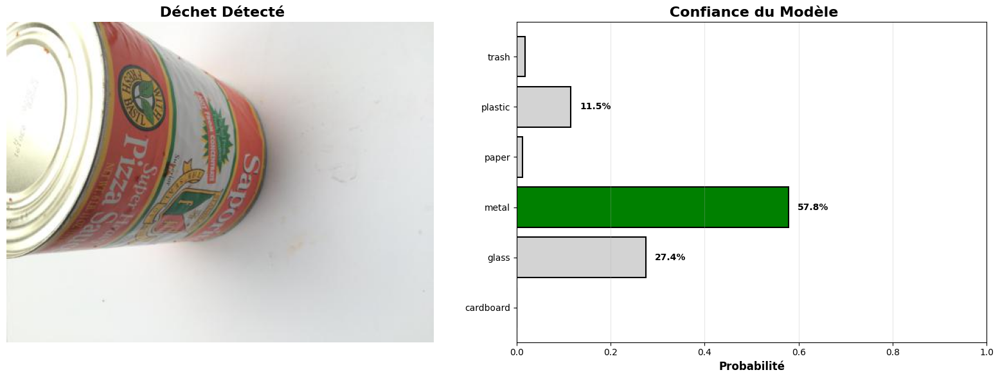


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: METAL
📊 Confiance: 57.8%

🥫 Recyclable (Métal)
💡 Canettes et conserves en métal



 PRÉDICTION CORRECTE!


 TEST SUR UN PAPER


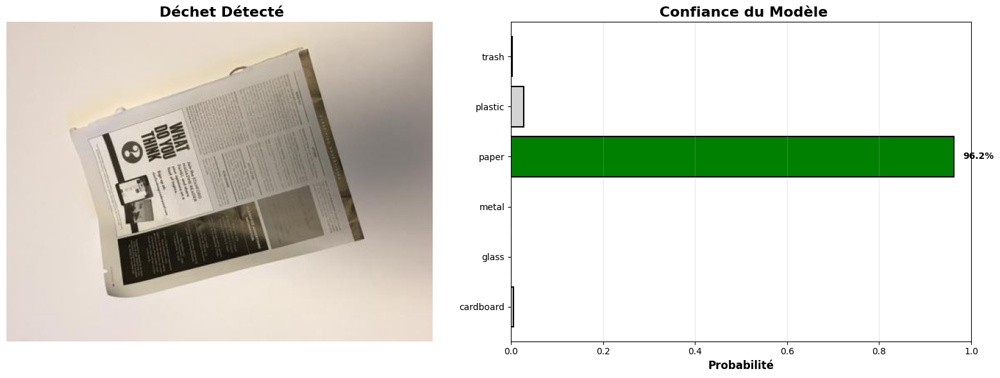


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: PAPER
📊 Confiance: 96.2%

📄 Recyclable (Papier)
💡 Papier propre et non gras



 PRÉDICTION CORRECTE!


 TEST SUR UN PLASTIC


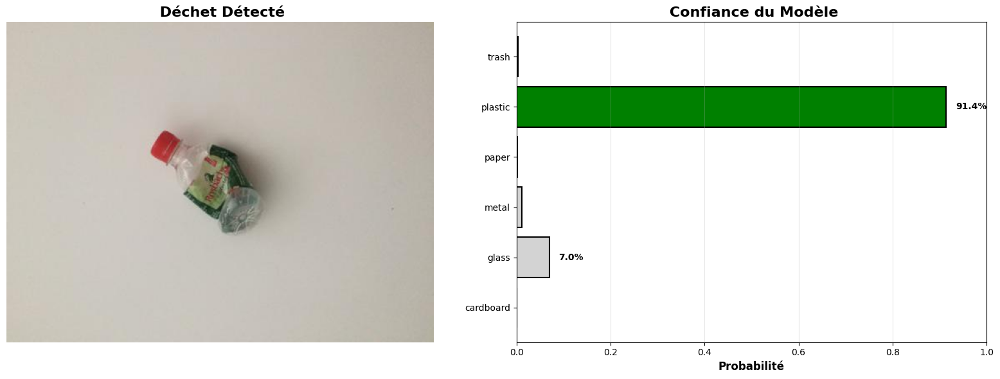


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: PLASTIC
📊 Confiance: 91.4%

🍶 Recyclable (Plastique)
💡 Bouteilles et emballages plastiques



 PRÉDICTION CORRECTE!


 TEST SUR UN TRASH


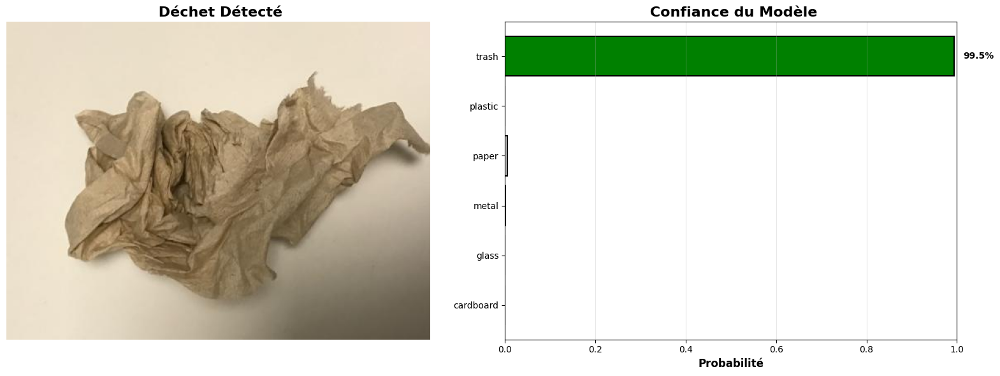


❌ RÉSULTAT DE CLASSIFICATION ❌

🎯 Déchet détecté: TRASH
📊 Confiance: 99.5%

🗑️ Déchets non recyclables
💡 Déchets résiduels



 PRÉDICTION CORRECTE!


In [5]:
# Prendre quelques images de test
test_dir = DATA_ROOT / 'processed' / 'test'

# Tester sur chaque classe
for cls in class_names:
    class_dir = test_dir / cls
    images = list(class_dir.glob('*.jpg'))
    
    if images:
        # Prendre la première image
        sample_image = images[0]
        
        print(f"\n\n{'='*70}")
        print(f" TEST SUR UN {cls.upper()}")
        print(f"{'='*70}")
        
        pred_class, conf, probs = predict_waste(
            sample_image, 
            model, 
            predict_transforms, 
            class_names, 
            device
        )
        
        # Vérifier si correct
        if pred_class == cls:
            print("\n PRÉDICTION CORRECTE!")
        else:
            print(f"\n ERREUR: Prédit {pred_class}, vrai classe: {cls}")

## 6.6 Test sur Nos propres Images


 Dossier trouvé: c:\Users\Asus\Desktop\trash-hero\notebooks\..\data\test_images


 Catégorie: CARDBOARD - 5 image(s)

 Test de: cardboard1.jpg


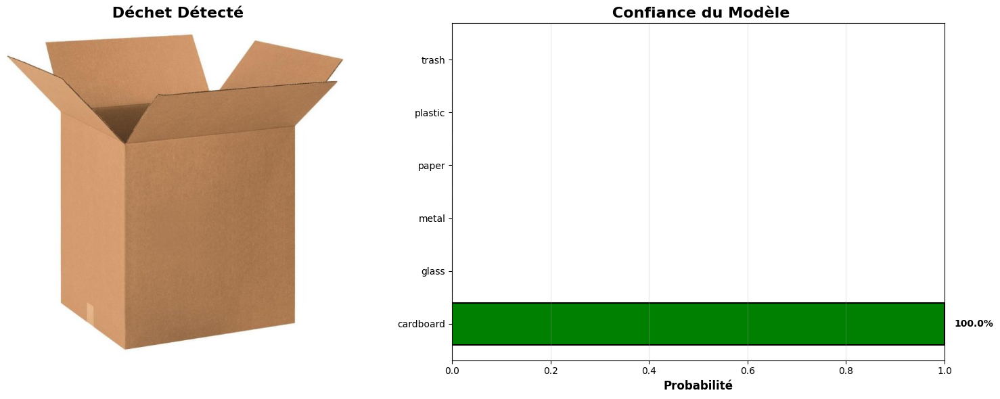


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: CARDBOARD
📊 Confiance: 100.0%

📦 Recyclable (Papier/Carton)
💡 Carton propre et sec


 CORRECT
  Attendu    : cardboard
  Prédit     : cardboard
  Confiance  : 100.0%

 Test de: cardboard3.jpg


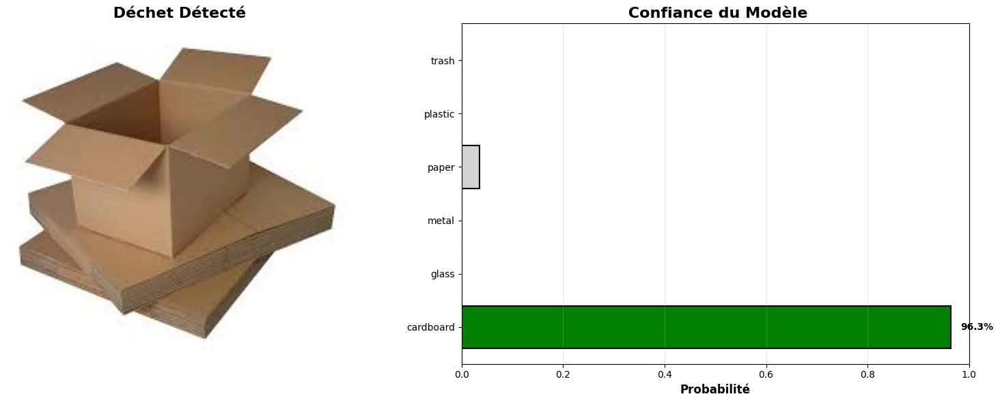


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: CARDBOARD
📊 Confiance: 96.3%

📦 Recyclable (Papier/Carton)
💡 Carton propre et sec


 CORRECT
  Attendu    : cardboard
  Prédit     : cardboard
  Confiance  : 96.3%

 Test de: cardboard4.jpg


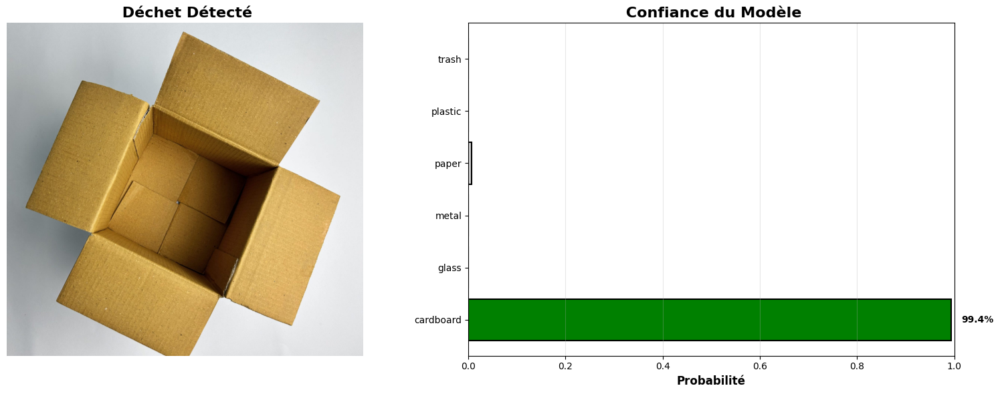


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: CARDBOARD
📊 Confiance: 99.4%

📦 Recyclable (Papier/Carton)
💡 Carton propre et sec


 CORRECT
  Attendu    : cardboard
  Prédit     : cardboard
  Confiance  : 99.4%

 Test de: cardboard5.jpg


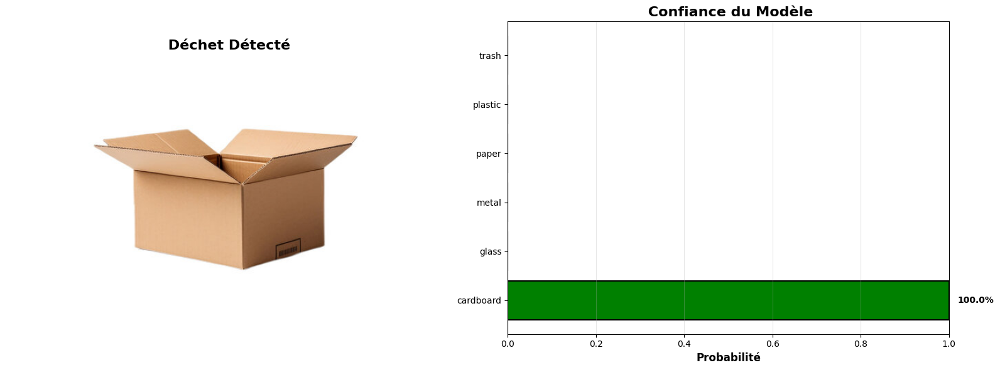


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: CARDBOARD
📊 Confiance: 100.0%

📦 Recyclable (Papier/Carton)
💡 Carton propre et sec


 CORRECT
  Attendu    : cardboard
  Prédit     : cardboard
  Confiance  : 100.0%

 Test de: cardboard2.png


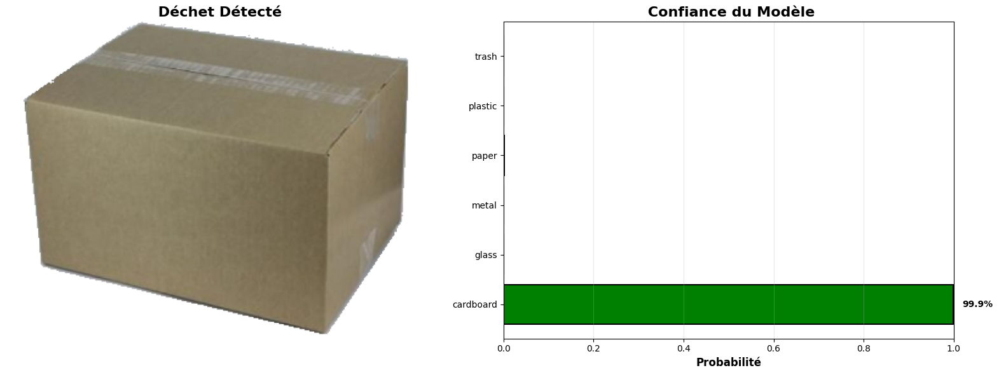


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: CARDBOARD
📊 Confiance: 99.9%

📦 Recyclable (Papier/Carton)
💡 Carton propre et sec


 CORRECT
  Attendu    : cardboard
  Prédit     : cardboard
  Confiance  : 99.9%

 Résumé cardboard: 5/5 correctes (100.0%)

 Catégorie: GLASS - 5 image(s)

 Test de: bottle1.jpg


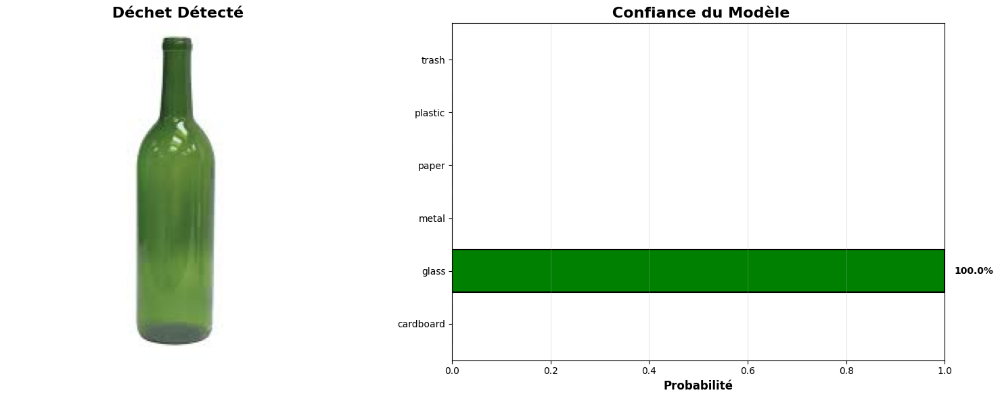


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: GLASS
📊 Confiance: 100.0%

🍾 Recyclable (Verre)
💡 Bouteilles et bocaux en verre


 CORRECT
  Attendu    : glass
  Prédit     : glass
  Confiance  : 100.0%

 Test de: bottle2.jpg


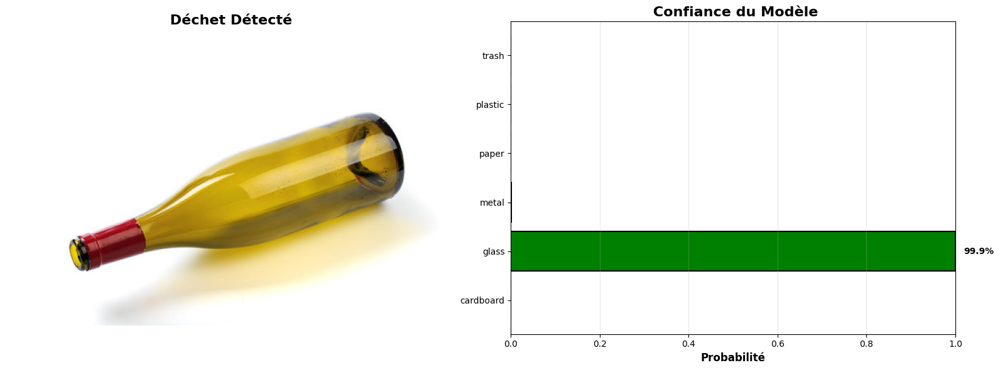


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: GLASS
📊 Confiance: 99.9%

🍾 Recyclable (Verre)
💡 Bouteilles et bocaux en verre


 CORRECT
  Attendu    : glass
  Prédit     : glass
  Confiance  : 99.9%

 Test de: bottle3.jpg


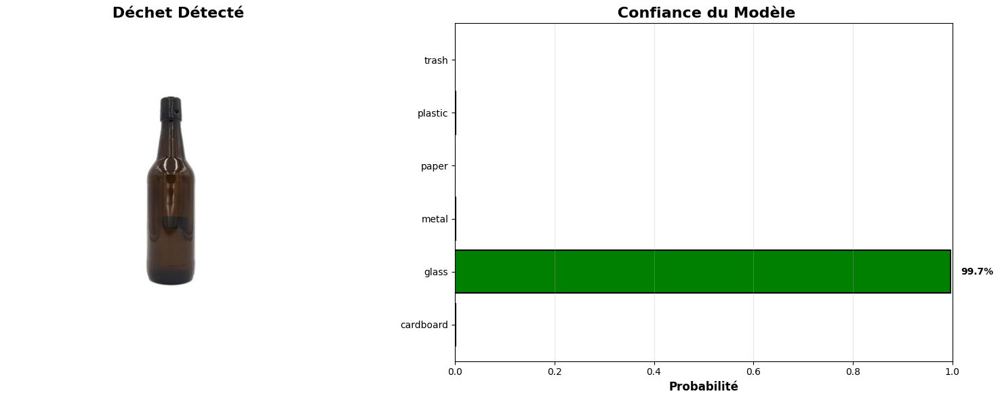


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: GLASS
📊 Confiance: 99.7%

🍾 Recyclable (Verre)
💡 Bouteilles et bocaux en verre


 CORRECT
  Attendu    : glass
  Prédit     : glass
  Confiance  : 99.7%

 Test de: bottle4.jpg


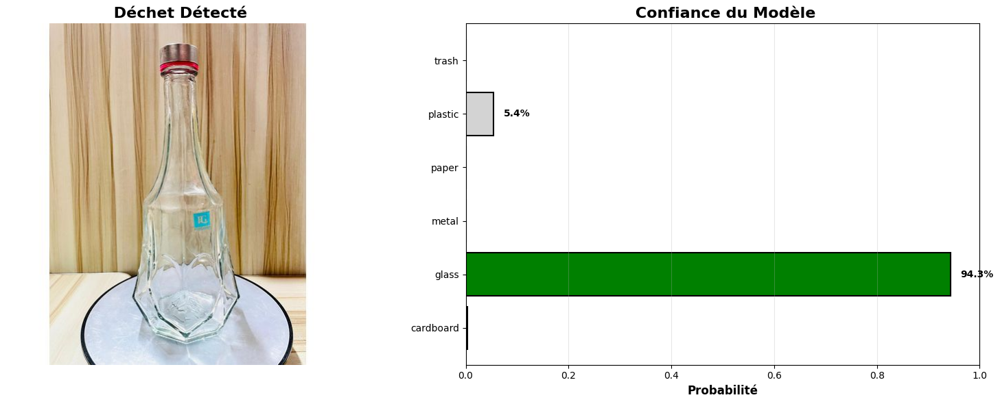


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: GLASS
📊 Confiance: 94.3%

🍾 Recyclable (Verre)
💡 Bouteilles et bocaux en verre


 CORRECT
  Attendu    : glass
  Prédit     : glass
  Confiance  : 94.3%

 Test de: bottle5.jpg


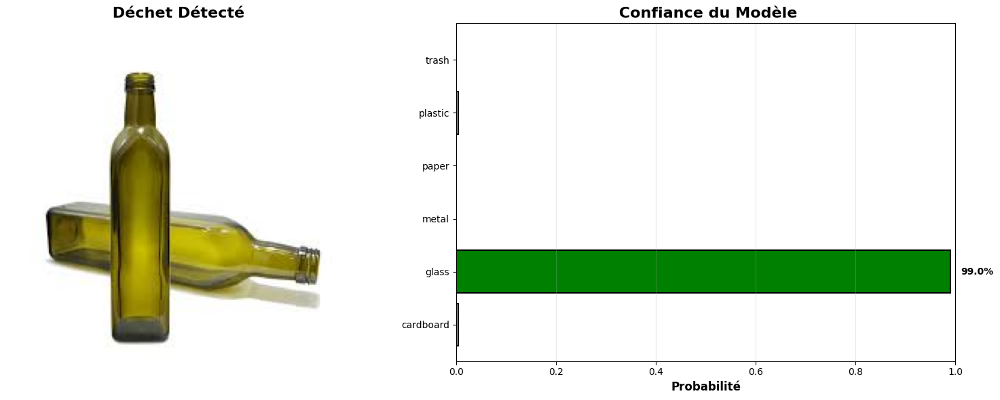


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: GLASS
📊 Confiance: 99.0%

🍾 Recyclable (Verre)
💡 Bouteilles et bocaux en verre


 CORRECT
  Attendu    : glass
  Prédit     : glass
  Confiance  : 99.0%

 Résumé glass: 5/5 correctes (100.0%)

 Catégorie: METAL - 5 image(s)

 Test de: can1.jpg


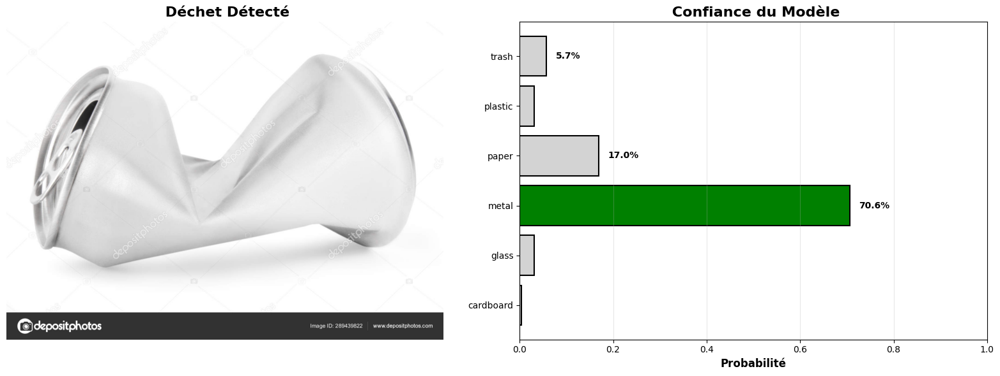


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: METAL
📊 Confiance: 70.6%

🥫 Recyclable (Métal)
💡 Canettes et conserves en métal


 CORRECT
  Attendu    : metal
  Prédit     : metal
  Confiance  : 70.6%

 Test de: can2.jpg


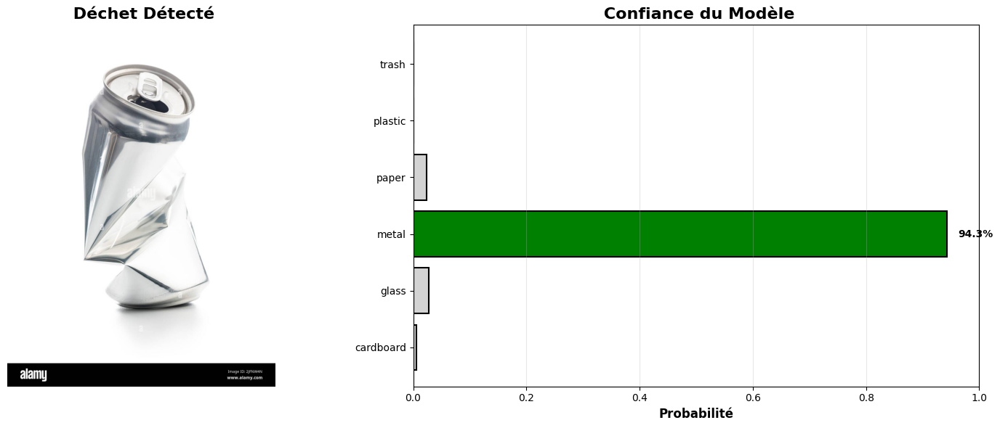


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: METAL
📊 Confiance: 94.3%

🥫 Recyclable (Métal)
💡 Canettes et conserves en métal


 CORRECT
  Attendu    : metal
  Prédit     : metal
  Confiance  : 94.3%

 Test de: can3.jpg


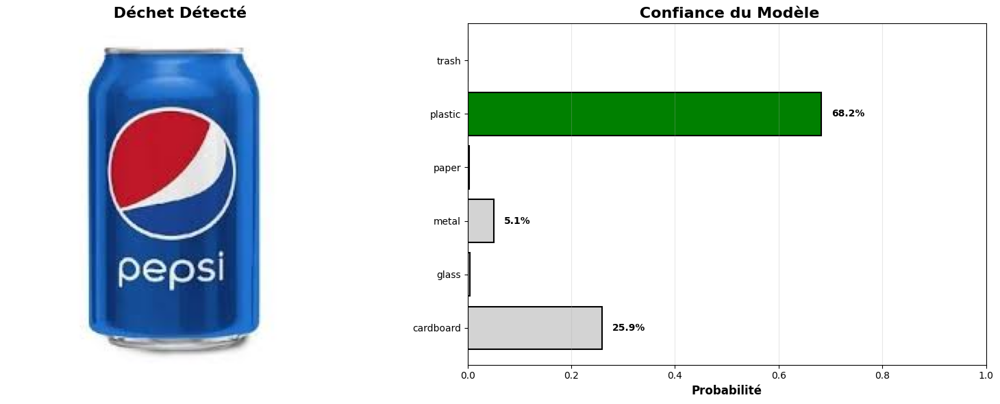


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: PLASTIC
📊 Confiance: 68.2%

🍶 Recyclable (Plastique)
💡 Bouteilles et emballages plastiques


 INCORRECT
  Attendu    : metal
  Prédit     : plastic
  Confiance  : 68.2%

 Test de: can4.jpg


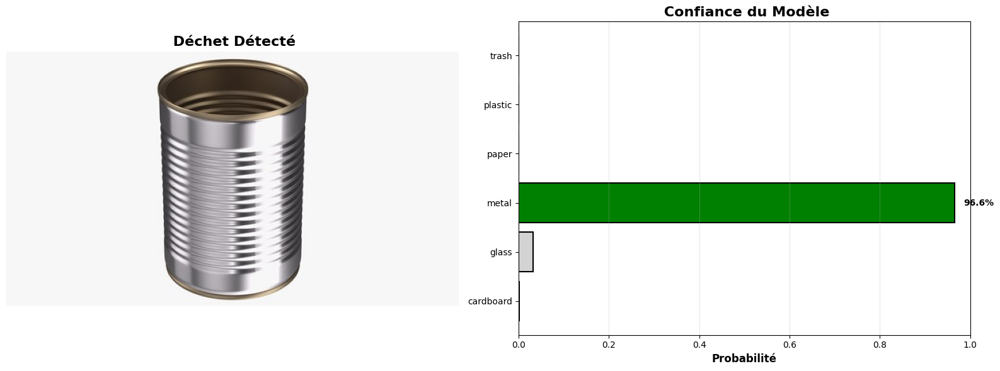


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: METAL
📊 Confiance: 96.6%

🥫 Recyclable (Métal)
💡 Canettes et conserves en métal


 CORRECT
  Attendu    : metal
  Prédit     : metal
  Confiance  : 96.6%

 Test de: can5.jpg


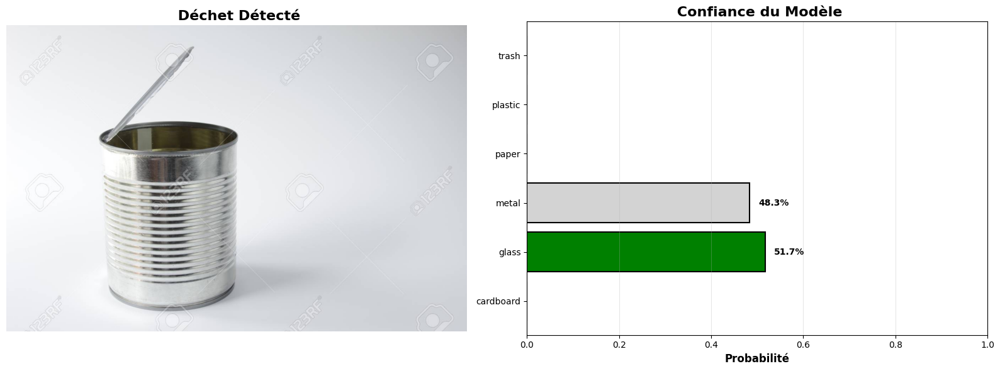


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: GLASS
📊 Confiance: 51.7%

🍾 Recyclable (Verre)
💡 Bouteilles et bocaux en verre


 INCORRECT
  Attendu    : metal
  Prédit     : glass
  Confiance  : 51.7%

 Résumé metal: 3/5 correctes (60.0%)

 Catégorie: PAPER - 5 image(s)

 Test de: paper1.jpg


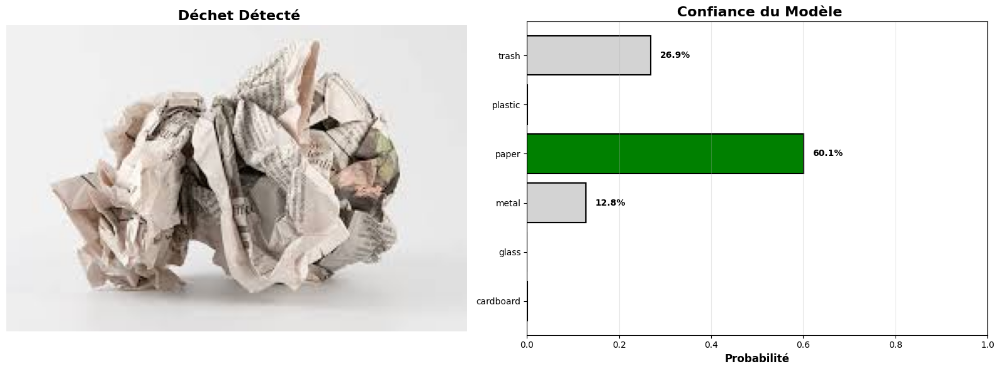


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: PAPER
📊 Confiance: 60.1%

📄 Recyclable (Papier)
💡 Papier propre et non gras


 CORRECT
  Attendu    : paper
  Prédit     : paper
  Confiance  : 60.1%

 Test de: paper2.jpg


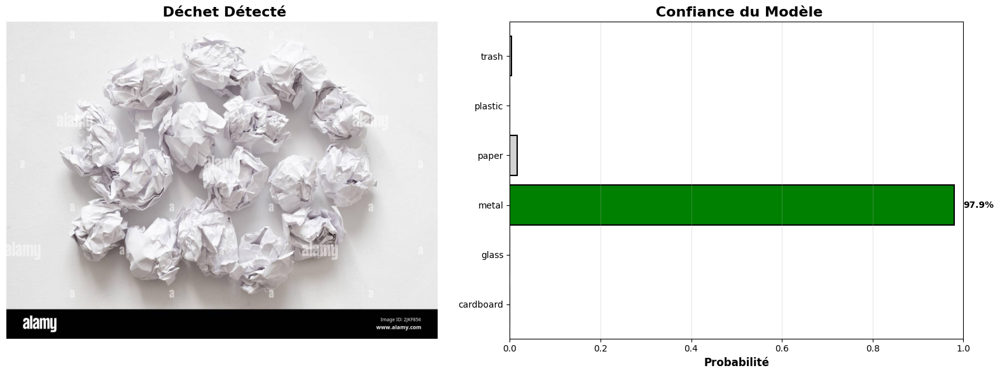


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: METAL
📊 Confiance: 97.9%

🥫 Recyclable (Métal)
💡 Canettes et conserves en métal


 INCORRECT
  Attendu    : paper
  Prédit     : metal
  Confiance  : 97.9%

 Test de: paper3.jpg


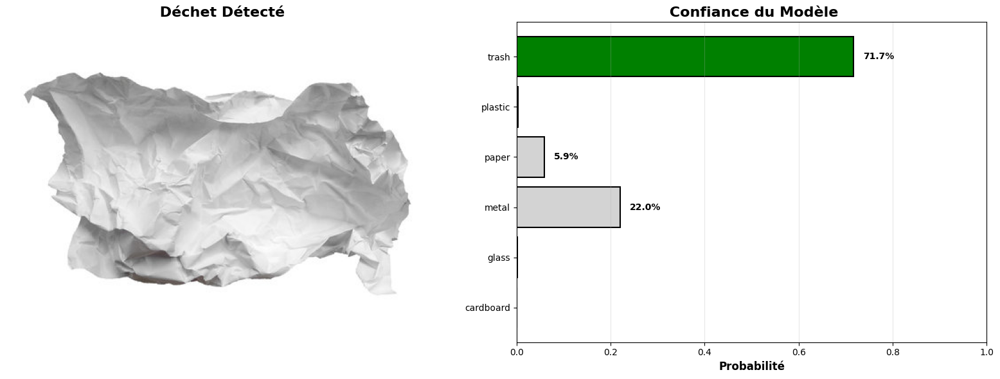


❌ RÉSULTAT DE CLASSIFICATION ❌

🎯 Déchet détecté: TRASH
📊 Confiance: 71.7%

🗑️ Déchets non recyclables
💡 Déchets résiduels


 INCORRECT
  Attendu    : paper
  Prédit     : trash
  Confiance  : 71.7%

 Test de: paper4.jpeg


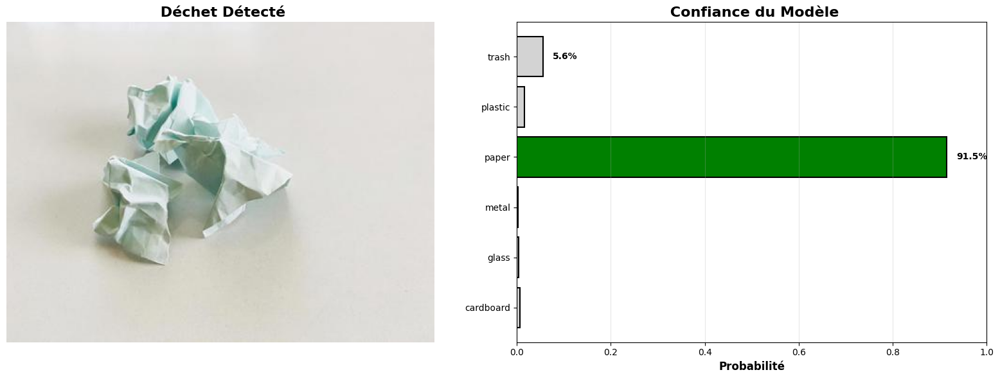


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: PAPER
📊 Confiance: 91.5%

📄 Recyclable (Papier)
💡 Papier propre et non gras


 CORRECT
  Attendu    : paper
  Prédit     : paper
  Confiance  : 91.5%

 Test de: paper5.png


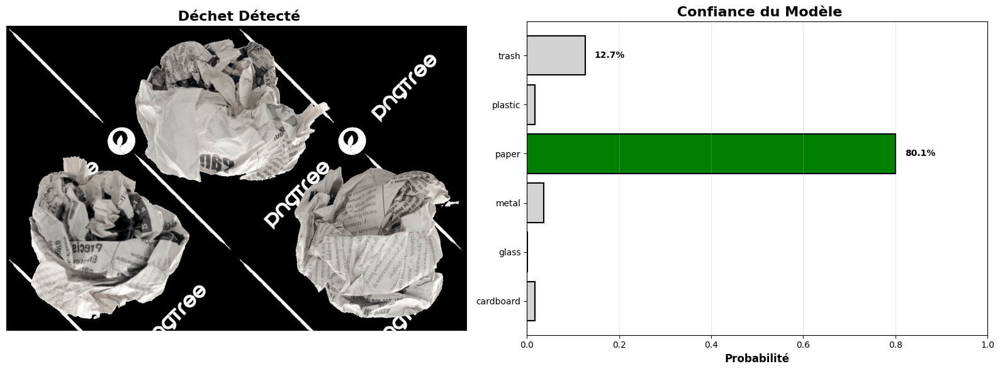


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: PAPER
📊 Confiance: 80.1%

📄 Recyclable (Papier)
💡 Papier propre et non gras


 CORRECT
  Attendu    : paper
  Prédit     : paper
  Confiance  : 80.1%

 Résumé paper: 3/5 correctes (60.0%)

 Catégorie: PLASTIC - 5 image(s)

 Test de: plastic1.jpg


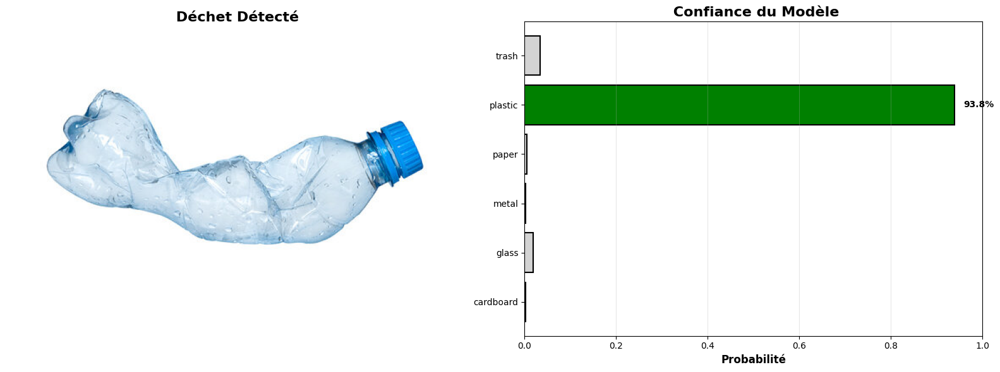


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: PLASTIC
📊 Confiance: 93.8%

🍶 Recyclable (Plastique)
💡 Bouteilles et emballages plastiques


 CORRECT
  Attendu    : plastic
  Prédit     : plastic
  Confiance  : 93.8%

 Test de: plastic2.jpg


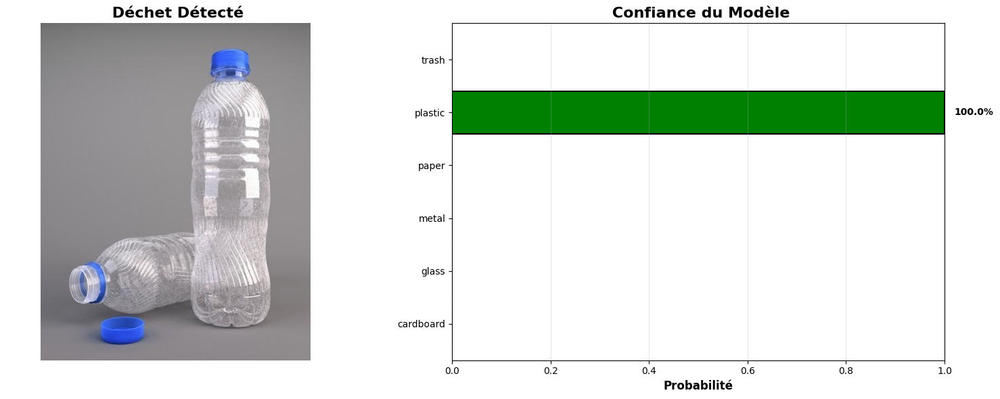


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: PLASTIC
📊 Confiance: 100.0%

🍶 Recyclable (Plastique)
💡 Bouteilles et emballages plastiques


 CORRECT
  Attendu    : plastic
  Prédit     : plastic
  Confiance  : 100.0%

 Test de: plastic3.jpg


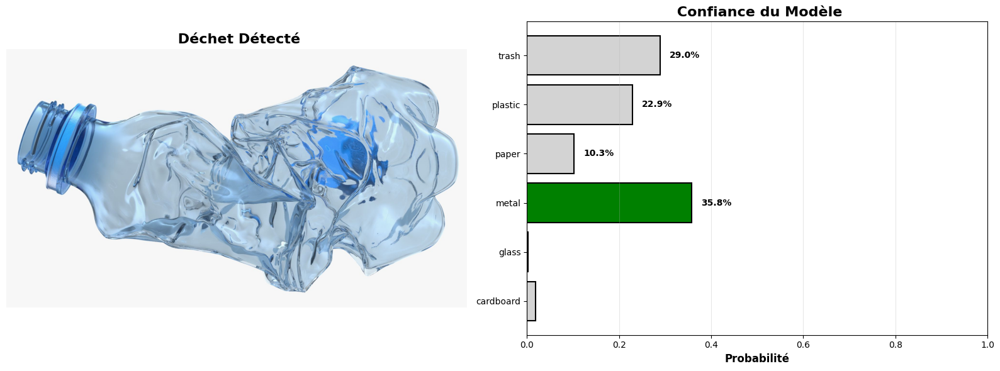


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: METAL
📊 Confiance: 35.8%

🥫 Recyclable (Métal)
💡 Canettes et conserves en métal


 INCORRECT
  Attendu    : plastic
  Prédit     : metal
  Confiance  : 35.8%

 Test de: plastic4.jpg


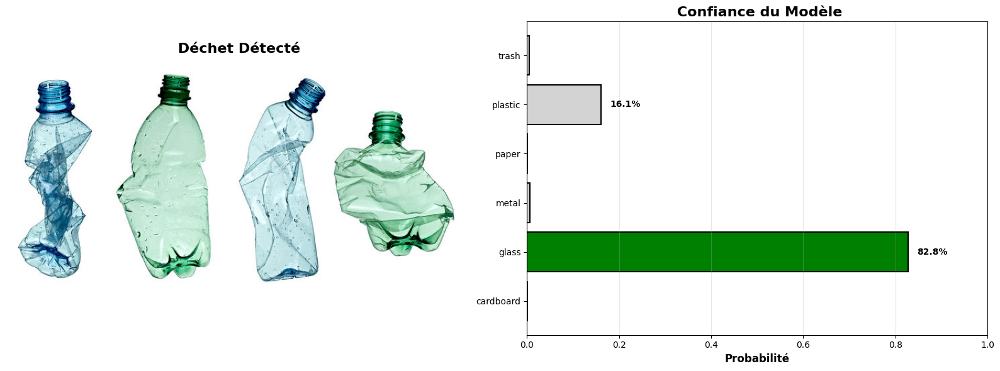


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: GLASS
📊 Confiance: 82.8%

🍾 Recyclable (Verre)
💡 Bouteilles et bocaux en verre


 INCORRECT
  Attendu    : plastic
  Prédit     : glass
  Confiance  : 82.8%

 Test de: plastic5.jpg


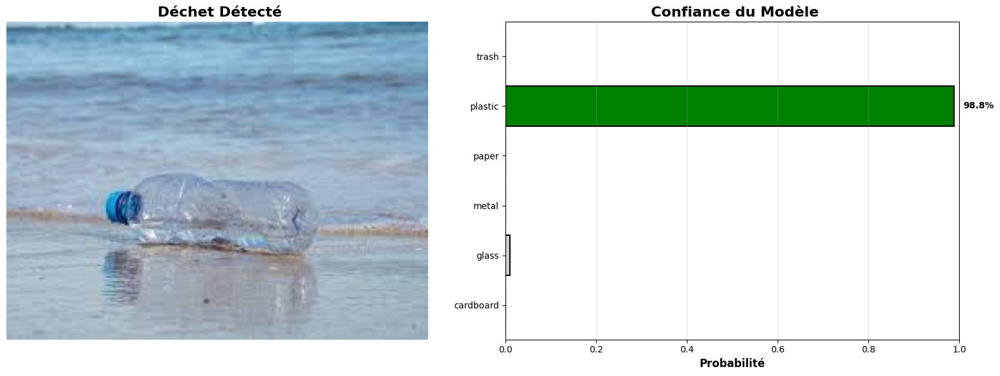


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: PLASTIC
📊 Confiance: 98.8%

🍶 Recyclable (Plastique)
💡 Bouteilles et emballages plastiques


 CORRECT
  Attendu    : plastic
  Prédit     : plastic
  Confiance  : 98.8%

 Résumé plastic: 3/5 correctes (60.0%)

 Catégorie: TRASH - 5 image(s)

 Test de: trash1.jpg


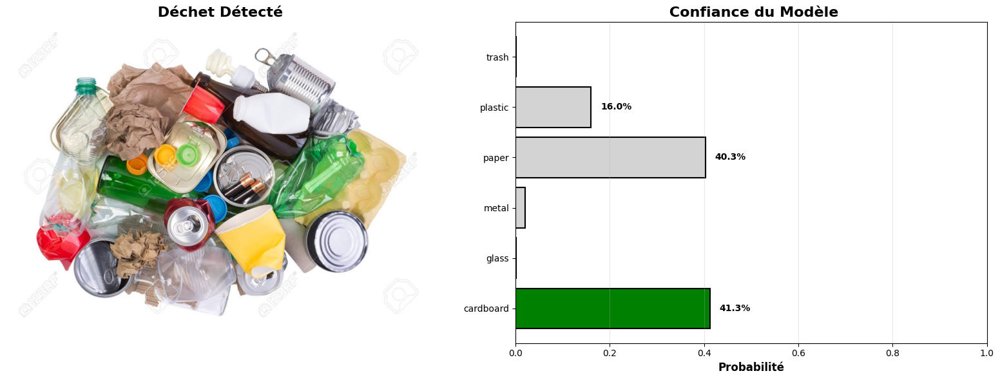


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: CARDBOARD
📊 Confiance: 41.3%

📦 Recyclable (Papier/Carton)
💡 Carton propre et sec


 INCORRECT
  Attendu    : trash
  Prédit     : cardboard
  Confiance  : 41.3%

 Test de: trash2.jpg


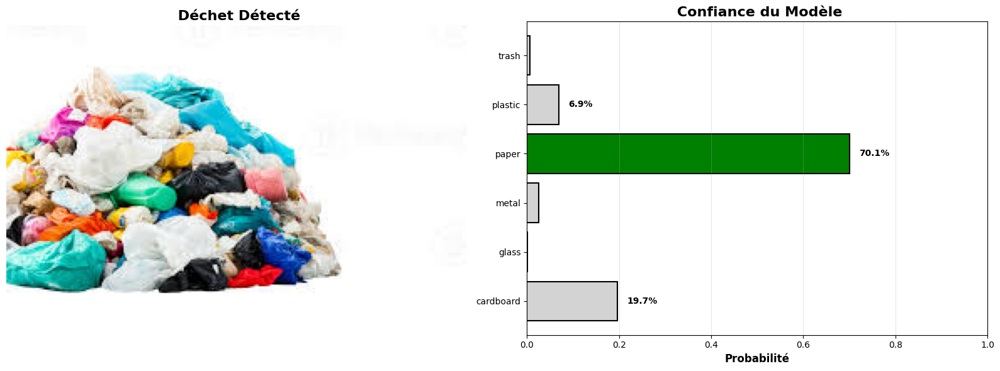


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: PAPER
📊 Confiance: 70.1%

📄 Recyclable (Papier)
💡 Papier propre et non gras


 INCORRECT
  Attendu    : trash
  Prédit     : paper
  Confiance  : 70.1%

 Test de: trash3.jpg


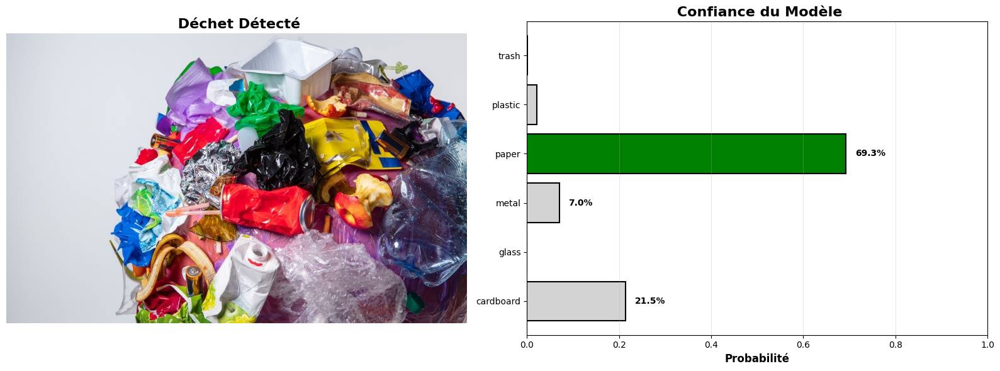


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: PAPER
📊 Confiance: 69.3%

📄 Recyclable (Papier)
💡 Papier propre et non gras


 INCORRECT
  Attendu    : trash
  Prédit     : paper
  Confiance  : 69.3%

 Test de: trash4.jpg


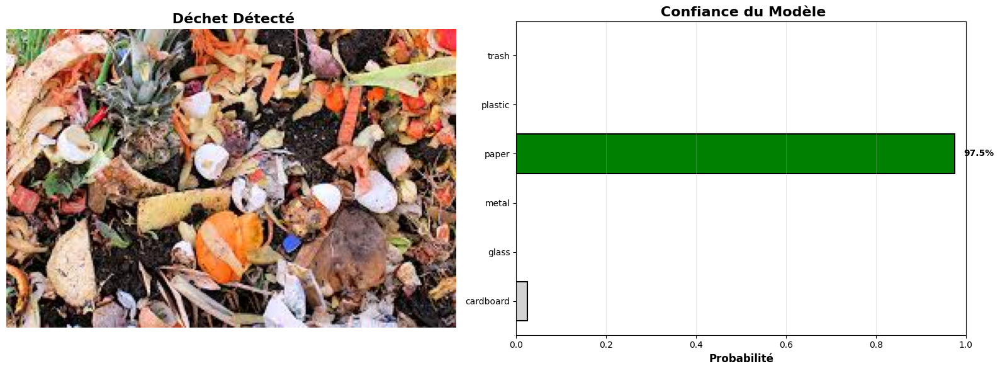


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: PAPER
📊 Confiance: 97.5%

📄 Recyclable (Papier)
💡 Papier propre et non gras


 INCORRECT
  Attendu    : trash
  Prédit     : paper
  Confiance  : 97.5%

 Test de: trash5.png


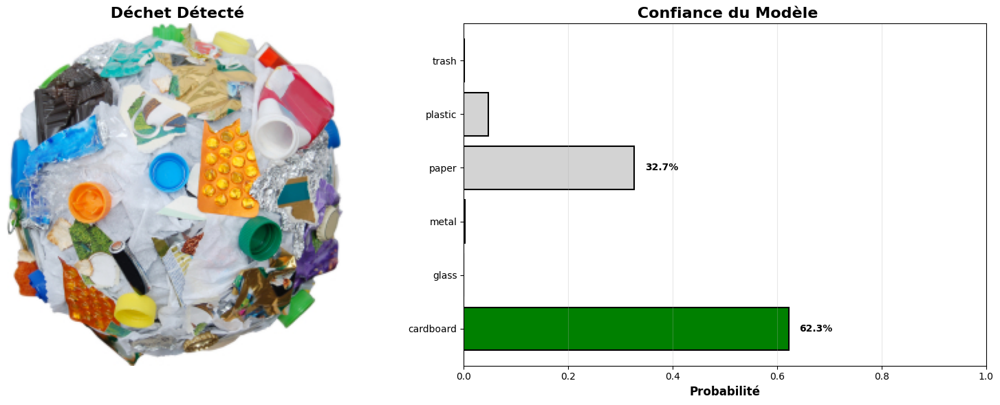


♻️ RÉSULTAT DE CLASSIFICATION ♻️

🎯 Déchet détecté: CARDBOARD
📊 Confiance: 62.3%

📦 Recyclable (Papier/Carton)
💡 Carton propre et sec


 INCORRECT
  Attendu    : trash
  Prédit     : cardboard
  Confiance  : 62.3%

 Résumé trash: 0/5 correctes (0.0%)

 Tests terminés!


In [11]:
# Test sur vos propres images
from pathlib import Path

test_images_dir = Path('../data/test_images')

# Vérifier que le dossier existe
if not test_images_dir.exists():
    print(" Le dossier test_images n'existe pas!")
    print(f"Créez-le ici: {test_images_dir.absolute()}")
else:
    print(f" Dossier trouvé: {test_images_dir.absolute()}\n")
    
    # Pour chaque catégorie
    for category in ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']:
        category_path = test_images_dir / category
        
        if category_path.exists():
            # Chercher tous les formats d'images
            images = (
                list(category_path.glob('*.jpg')) + 
                list(category_path.glob('*.jpeg')) + 
                list(category_path.glob('*.png'))
            )
            
            print(f"\n{'='*70}")
            print(f" Catégorie: {category.upper()} - {len(images)} image(s)")
            print('='*70)
            
            if len(images) == 0:
                print(f"  Aucune image trouvée dans {category}/")
                continue
            
            # Tester chaque image
            correct_count = 0
            for img_path in images:
                print(f"\n Test de: {img_path.name}")
                
                try:
                    pred_class, conf, probs = predict_waste(
                        img_path, 
                        model, 
                        predict_transforms, 
                        class_names, 
                        device
                    )
                    
                    # Vérifier si la prédiction est correcte
                    is_correct = pred_class == category
                    correct_count += is_correct
                    status = " CORRECT" if is_correct else " INCORRECT"
                    
                    print(f"{status}")
                    print(f"  Attendu    : {category}")
                    print(f"  Prédit     : {pred_class}")
                    print(f"  Confiance  : {conf:.1%}")
                    
                except Exception as e:
                    print(f" Erreur lors du traitement: {e}")
            
            # Résumé pour cette catégorie
            accuracy = (correct_count / len(images)) * 100 if len(images) > 0 else 0
            print(f"\n Résumé {category}: {correct_count}/{len(images)} correctes ({accuracy:.1f}%)")
            
        else:
            print(f"\n  Dossier {category}/ non trouvé")
    
    print(f"\n{'='*70}")
    print(" Tests terminés!")
    print('='*70)

## 6.7 API de Prédiction Simple

In [13]:
class WasteClassifierAPI:
    """
    API simple pour la classification des déchets
    Utilisable dans une application Flask/FastAPI
    """
    
    def __init__(self, model_path, class_names, device='cpu'):
        self.device = device
        self.class_names = class_names
        
        # Charger le modèle
        self.model = mobilenet_v2(weights=None)
        self.model.classifier = nn.Sequential(
            nn.Dropout(0.2),
            nn.Linear(1280, len(class_names))
        )
        self.model.load_state_dict(torch.load(model_path, map_location=device))
        self.model.to(device)
        self.model.eval()
        
        # Transforms
        self.transforms = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                               std=[0.229, 0.224, 0.225])
        ])
    
    def predict(self, image_path):
        """
        Prédit la classe d'un déchet
        
        Returns:
            dict: {
                'class': str,
                'confidence': float,
                'bin': str,
                'all_probabilities': dict
            }
        """
        # Charger l'image
        img = Image.open(image_path).convert('RGB')
        img_tensor = self.transforms(img).unsqueeze(0).to(self.device)
        
        # Prédiction
        with torch.no_grad():
            outputs = self.model(img_tensor)
            probs = F.softmax(outputs, dim=1)[0]
            confidence, pred_idx = torch.max(probs, 0)
        
        predicted_class = self.class_names[pred_idx.item()]
        bin_info = get_bin_recommendation(predicted_class)
        
        # Formater la réponse
        result = {
            'class': predicted_class,
            'confidence': float(confidence.item()),
            'bin': bin_info['bin'],
            'icon': bin_info['icon'],
            'description': bin_info['description'],
            'all_probabilities': {
                cls: float(prob) 
                for cls, prob in zip(self.class_names, probs.cpu().numpy())
            }
        }
        
        return result

# Créer l'API
api = WasteClassifierAPI(
    model_path=MODELS_DIR / 'mobilenet_final_best.pth',
    class_names=class_names,
    device=device
)

print(" API de classification créée")
print("\nUtilisation:")
print("  result = api.predict('path/to/image.jpg')")
print("  print(result)")

 API de classification créée

Utilisation:
  result = api.predict('path/to/image.jpg')
  print(result)


## 6.8 Test de l'API

In [14]:
# Test de l'API
test_image = list((test_dir / 'plastic').glob('*.jpg'))[0]

result = api.predict(test_image)

print("\n" + "="*70)
print(" RÉSULTAT DE L'API")
print("="*70)
print(json.dumps(result, indent=2, ensure_ascii=False))
print("="*70)


 RÉSULTAT DE L'API
{
  "class": "plastic",
  "confidence": 0.9143142104148865,
  "bin": "🍶 Recyclable (Plastique)",
  "icon": "♻️",
  "description": "Bouteilles et emballages plastiques",
  "all_probabilities": {
    "cardboard": 0.00017088708409573883,
    "glass": 0.06971927732229233,
    "metal": 0.011723914183676243,
    "paper": 0.0015248693525791168,
    "plastic": 0.9143142104148865,
    "trash": 0.0025468694511801004
  }
}


## 6.9 Guide d'Intégration Mobile

In [16]:
print("""
╔═══════════════════════════════════════════════════════════════════╗
║                  GUIDE D'INTÉGRATION MOBILE                    ║
╚═══════════════════════════════════════════════════════════════════╝
 OPTION 1: PyTorch Mobile (Android/iOS)
   ────────────────────────────────────────
   1. Convertir le modèle en TorchScript
      model_scripted = torch.jit.script(model)
      model_scripted.save('model_mobile.pt')
   
   2. Intégrer dans Android Studio:
      - Ajouter PyTorch Mobile library
      - Charger le modèle .pt
      - Préprocesser l'image depuis la caméra
      - Afficher les résultats

OPTION 2: TensorFlow Lite (Recommandé pour Flutter)
   ────────────────────────────────────────────────────
   1. Convertir PyTorch → ONNX → TFLite
   2. Utiliser tflite_flutter package
   3. Plus léger et optimisé
 OPTION 3: API REST (Backend)
   ──────────────────────────────
   1. Créer une API Flask/FastAPI
   2. L'app mobile envoie l'image
   3. L'API retourne la prédiction
   4. Avantage: Modèle centralisé, facile à mettre à jour

FICHIERS À UTILISER:
   ──────────────────────
   - mobilenet_final_best.pth (modèle PyTorch)
   - mobilenet_quantized.pth (modèle optimisé)
   - mobilenet_traced.pt (TorchScript)

 WORKFLOW MOBILE RECOMMANDÉ:
   ────────────────────────────
   1. Utilisateur ouvre la caméra
   2. Prend une photo du déchet
   3. L'image est préprocessée (resize, normalize)
   4. Le modèle prédit la classe
   5. Afficher:
      - La classe du déchet
      - La poubelle recommandée (avec icône/couleur)
      - La confiance de la prédiction
      - Points de gamification

╚═══════════════════════════════════════════════════════════════════╝
""")


╔═══════════════════════════════════════════════════════════════════╗
║                  GUIDE D'INTÉGRATION MOBILE                    ║
╚═══════════════════════════════════════════════════════════════════╝
 OPTION 1: PyTorch Mobile (Android/iOS)
   ────────────────────────────────────────
   1. Convertir le modèle en TorchScript
      model_scripted = torch.jit.script(model)
      model_scripted.save('model_mobile.pt')

   2. Intégrer dans Android Studio:
      - Ajouter PyTorch Mobile library
      - Charger le modèle .pt
      - Préprocesser l'image depuis la caméra
      - Afficher les résultats

OPTION 2: TensorFlow Lite (Recommandé pour Flutter)
   ────────────────────────────────────────────────────
   1. Convertir PyTorch → ONNX → TFLite
   2. Utiliser tflite_flutter package
   3. Plus léger et optimisé
 OPTION 3: API REST (Backend)
   ──────────────────────────────
   1. Créer une API Flask/FastAPI
   2. L'app mobile envoie l'image
   3. L'API retourne la prédiction
   4. Ava

## 6.10 Code Exemple pour Flask API

In [18]:
# Sauvegarde du code Flask dans un fichier
flask_code = '''
# app.py - API Flask pour Trash Hero

from flask import Flask, request, jsonify
from PIL import Image
import torch
import torch.nn as nn
from torchvision.models import mobilenet_v2
import torchvision.transforms as transforms
import io

app = Flask(__name__)

# Charger le modèle au démarrage
device = torch.device('cpu')
model = mobilenet_v2(weights=None)
model.classifier = nn.Sequential(
    nn.Dropout(0.2),
    nn.Linear(1280, 6)  # 6 classes
)
model.load_state_dict(torch.load('mobilenet_final_best.pth', map_location=device))
model.eval()

# Transforms
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

class_names = ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']

@app.route('/predict', methods=['POST'])
def predict():
    if 'image' not in request.files:
        return jsonify({'error': 'No image provided'}), 400
    
    # Lire l'image
    image_file = request.files['image']
    image = Image.open(io.BytesIO(image_file.read())).convert('RGB')
    
    # Préprocesser
    img_tensor = transform(image).unsqueeze(0)
    
    # Prédire
    with torch.no_grad():
        output = model(img_tensor)
        probs = torch.nn.functional.softmax(output, dim=1)[0]
        confidence, pred_idx = torch.max(probs, 0)
    
    result = {
        'class': class_names[pred_idx.item()],
        'confidence': float(confidence.item()),
        'probabilities': {cls: float(prob) for cls, prob in zip(class_names, probs)}
    }
    
    return jsonify(result)

if __name__ == '__main__':
    app.run(host='0.0.0.0', port=5000)
'''

# Sauvegarder
with open(PROJECT_ROOT / 'flask_app.py', 'w') as f:
    f.write(flask_code)

print(" Code Flask API sauvegardé dans flask_app.py")
print("\n Pour lancer l'API:")
print("   pip install flask")
print("   python flask_app.py")
print("\n Pour tester:")
print("   curl -X POST -F 'image=@test.jpg' http://localhost:5000/predict")

 Code Flask API sauvegardé dans flask_app.py

 Pour lancer l'API:
   pip install flask
   python flask_app.py

 Pour tester:
   curl -X POST -F 'image=@test.jpg' http://localhost:5000/predict


##  PROJET TERMINÉ !

####  Récapitulatif du Projet:

1. **Notebook 1**: Préparation des données (train/valid/test split)
2. **Notebook 2**: CNN Baseline (~75-80% accuracy)
3. **Notebook 3**: Transfer Learning MobileNetV2 (~85-92% accuracy)
4. **Notebook 4**: Data Augmentation avancée
5. **Notebook 5**: Optimisation (quantization, -60% taille)
6. **Notebook 6**: Déploiement et API

#### Prêt pour la Production:

- Modèle léger (< 10 MB)
- Rapide (< 50 ms/image)
- Précis (> 85% accuracy)
- API REST prête
- Code mobile-ready

####  Prochaines Étapes:

1. **Intégration Mobile**:
   - Créer l'app Flutter/React Native
   - Intégrer la caméra
   - Ajouter le système de gamification

2. **Dashboard Municipal**:
   - Statistiques de tri
   - Cartes de zones polluées
   - Suivi des performances

3. **Améliorations**:
   - Ajouter plus de classes (masques, mégots)
   - Dataset tunisien localisé
   - Détection de poubelles pleines



---